## Import packages

In [1]:
# Importaciones estándar de Python
import random
import math
from pathlib import Path

# Importaciones para el análisis y manipulación de datos
import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.geometry import Point

# Importaciones para la creación y manipulación de grafos
import networkx as nx
import osmnx as ox

# Importaciones para la visualización con gráficos
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

# Importaciones para la visualización geoespacial
import folium

# Importaciones para el escalado de datos y técnicas de clustering
from sklearn.preprocessing import RobustScaler
from sklearn_extra.cluster import KMedoids

# Importaciones para la resolución de problemas de optimización y rutas
from ortools.constraint_solver import pywrapcp
from ortools.constraint_solver import routing_enums_pb2

# Importaciones para métricas de evaluación
from sklearn.metrics import silhouette_score



## Load data

In [2]:
def load_data(nombre_archivo, directorio_base='../../data/input'):
    """
    Carga un archivo GeoJSON específico y devuelve un GeoDataFrame.
    
    Args:
        nombre_archivo (str): Nombre del archivo GeoJSON (ej. 'barris.geojson').
        directorio_base (str): Ruta relativa al directorio donde se encuentra el archivo.
                              Por defecto: '../../data/delivetter'.
    
    Returns:
        gpd.GeoDataFrame: GeoDataFrame con los datos del archivo.
    """
    try:
        ruta = Path(directorio_base) / nombre_archivo
        
        if not ruta.exists():
            raise FileNotFoundError(f"File not found: {ruta.absolute()}")
        
        gdf = gpd.read_file(ruta)
        print(f"✅ '{nombre_archivo}' successfully loaded ({len(gdf)} records)")
        return gdf
    
    except Exception as e:
        print(f"❌ Error loading '{nombre_archivo}': {str(e)}")
    
barrios = load_data('barris.geojson')
catastro = load_data('catastro.geojson')
puntos_carga = load_data('puntosCID.geojson')

✅ 'barris.geojson' successfully loaded (63 records)
✅ 'catastro.geojson' successfully loaded (36346 records)
✅ 'puntosCID.geojson' successfully loaded (882 records)


## Graph request 

In [3]:
def get_graph(request):
    global barrio, G_drive, G_walk, shp_zone, shp_loading_points, shp_bajos

    shp_neighbourhood = barrios[barrios["nombre"].str.strip().str.upper() == request.strip().upper()]
    if len(shp_neighbourhood) != 1:
        shp_neighbourhood = barrios[barrios["nombre"].str.upper().str.contains(request.strip().upper())]
    while len(shp_neighbourhood) != 1:
        request = input("Please, introduce a valid neighbourhood: ")
        shp_neighbourhood = barrios[barrios["nombre"].str.strip().str.upper() == request.strip().upper()]
        if len(shp_neighbourhood) == 1:
            break
        shp_neighbourhood = barrios[barrios["nombre"].str.upper().str.contains(request.strip().upper())]

    barrio = shp_neighbourhood["nombre"].values[0]
    shp_zone = shp_neighbourhood.geometry.values[0]
    shp_loading_points = puntos_carga[puntos_carga.intersects(shp_zone)]
    shp_bajos = catastro[catastro.intersects(shp_zone)]

    G = ox.graph_from_polygon(
        shp_zone,
        network_type="all_public",
        simplify=False,
        retain_all=False,
        truncate_by_edge=True
    )

    not_highway = ['elevator', 'busway', 'corridor', 'unclassified', 'services', 'cycleway', 'steps', 'service']
    allowed_vehicle = ['motorway', 'residential', 'secondary', 'living_street', 'primary_link', 'primary', 'tertiary', 'trunk', 'service', 'tertiary_link', 'trunk_link', 'secondary_link', 'motorway_link', 'road']
    allowed_pedestrian = ['pedestrian', 'footway', 'path', 'track', 'bridleway', 'living_street', 'residential']

    edges_to_remove = [(u, v, k) for u, v, k, data in G.edges(keys=True, data=True)
                       if data.get('highway') in not_highway or data.get('access') in ['private', 'no', 'customers']]
    G.remove_edges_from(edges_to_remove)

    G_vehicle = G.copy()
    G_pedestrian = G.copy()

    edges_to_remove_vehicle = [(u, v, k) for u, v, k, data in G_vehicle.edges(keys=True, data=True)
                                if data.get('highway') not in allowed_vehicle]
    G_vehicle.remove_edges_from(edges_to_remove_vehicle)

    edges_to_remove_pedestrian = [(u, v, k) for u, v, k, data in G_pedestrian.edges(keys=True, data=True)
                                  if data.get('highway') not in allowed_pedestrian]
    G_pedestrian.remove_edges_from(edges_to_remove_pedestrian)

    for graph in [G_vehicle, G_pedestrian]:
        nodes_to_remove = [node for node in graph.nodes if graph.degree(node) == 0]
        graph.remove_nodes_from(nodes_to_remove)

    G_drive = G_vehicle.subgraph(max(nx.weakly_connected_components(G_vehicle), key=len)).copy()
    G_walk = G_pedestrian.subgraph(max(nx.weakly_connected_components(G_pedestrian), key=len)).copy()


def graph_map():
    print(f"Graph for {barrio}:")
    print(f"Vehicle graph: {len(G_drive.nodes)} nodes, {len(G_drive.edges)} edges")
    print(f"Pedestrian graph: {len(G_walk.nodes)} nodes, {len(G_walk.edges)} edges")
    print(f"Loading points: {len(shp_loading_points)} points")
    print(f"Stores: {len(shp_bajos[shp_bajos['Comercio']])} points")
    print(f"Warehouses: {len(shp_bajos[shp_bajos['Almacen']])} points")
    
    
    # --- 1. Visualización de grafos en matplotlib ---
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    axes[0].set_aspect('equal', 'box')
    axes[1].set_aspect('equal', 'box')
    ox.plot_graph(G_drive, ax=axes[0], node_size=3, node_color='green', 
                  edge_linewidth=0.5, edge_color='blue', bgcolor="white", show=False)
    axes[0].set_title("Driving graph")

    ox.plot_graph(G_walk, ax=axes[1], node_size=3, node_color='green', 
                  edge_linewidth=0.5, edge_color='red', bgcolor="white", show=False)
    axes[1].set_title("Pedestrian graph")
    plt.tight_layout()
    plt.show()

    # --- 2. Mapa interactivo en Folium ---
    mapa = folium.Map(location=[shp_zone.centroid.y, shp_zone.centroid.x], zoom_start=16)

    gdf_edges_vehicle = ox.graph_to_gdfs(G_drive, nodes=False, edges=True)
    gdf_edges_pedestrian = ox.graph_to_gdfs(G_walk, nodes=False, edges=True)

    bajos_in_zone = shp_bajos[shp_bajos.intersects(shp_zone)]

    # --- 2.1 Crear capas para aristas, puntos de carga y bajos ---
    # Crear FeatureGroups para cada tipo de capa
    barrio_group = folium.FeatureGroup(name="Neighborhood Boundary")
    edge_group_vehicle = folium.FeatureGroup(name="Vehicle Edges")
    edge_group_pedestrian = folium.FeatureGroup(name="Pedestrian Edges")
    loading_points_group = folium.FeatureGroup(name="Loading Points")
    comercio_group = folium.FeatureGroup(name="Stores")
    almacen_group = folium.FeatureGroup(name="Warehouses")
    

    # --- 2.2 Añadir zona del barrio ---
    folium.GeoJson(
        shp_zone,
        style_function=lambda feature: {
            "color": "limegreen", "weight": 4, "fill": True,
            "fillColor": "limegreen", "fillOpacity": 0.1
        }
    ).add_to(barrio_group)

   

    # --- 2.3 Función para añadir aristas a las capas ---
    def add_edges(gdf_edges, color, group_name, group):
        for _, row in gdf_edges.iterrows():
            if row.geometry.geom_type == "LineString":
                tooltip = folium.Tooltip(
                    f"<b>Type:</b> {row.get('highway', 'N/A')}<br>"
                    f"<b>Name:</b> {row.get('name', 'No name')}<br>"
                    f"<b>Length:</b> {round(row.get('length', 0), 1)} m"
                )
                folium.GeoJson(
                    row.geometry,
                    name=group_name,
                    style_function=lambda feature, col=color: {'color': col, 'weight': 2, 'opacity': 1},
                    tooltip=tooltip
                ).add_to(group)

    # Añadir aristas a las capas correspondientes
    add_edges(gdf_edges_pedestrian, "red", "Pedestrians", edge_group_pedestrian)
    add_edges(gdf_edges_vehicle, "blue", "Vehicles", edge_group_vehicle)

    # --- 2.4 Añadir puntos de carga a la capa ---
    for _, row in shp_loading_points.iterrows():
        folium.CircleMarker(
            location=[row.geometry.centroid.y, row.geometry.centroid.x],
            radius=6, color="black", fill=True, fill_color="orange", fill_opacity=1,
            tooltip = folium.Tooltip(
                    f"<b>Type:</b> Loading Point<br>"
                    f"<b>Street:</b> {row.get("calle", "")}"
                )
        ).add_to(loading_points_group)

    # --- 2.5 Añadir puntos bajos (almacenes y comercios) a la capa ---
    for _, row in bajos_in_zone.iterrows():
        capa = []
        if not row['Almacen'] and not row['Comercio']:
            continue
        centroide = row.geometry.centroid
        if row['Almacen'] and row['Comercio']:
            fill_color, label = 'black', 'Warehouse & Store'
            capa = [comercio_group, almacen_group]
        elif row['Almacen']:
            fill_color, label = 'purple', 'Warehouse'
            capa = [almacen_group]
        else:
            fill_color, label = 'lightblue', 'Store'
            capa = [comercio_group]
        for group in capa:
            folium.CircleMarker(
                location=[centroide.y, centroide.x],
                radius=6, color='black', fill=True, fill_color=fill_color, fill_opacity=1,
                tooltip = folium.Tooltip(
                        f"<b>Type:</b> {label}<br>"
                        f"<b>Cadastral reference:</b> {row['reference']}"
                    )
            ).add_to(group)

    # --- 2.6 Añadir leyenda personalizada ---
    legend_html = '''
    <div style="position:fixed;bottom:10px;left:10px;display:inline-block;background:white;
                z-index:9999;font-size:13px;border:1px solid grey;border-radius:5px;
                padding:8px;box-shadow:2px 2px 5px rgba(0,0,0,0.2);">
    <span style="display:inline-block;width:12px;border-bottom:4px solid blue;margin-right:5px;vertical-align:middle"></span> Driving Graph<br>
    <span style="display:inline-block;width:12px;border-bottom:4px solid red;margin-right:5px;vertical-align:middle"></span> Pedestrian Graph<br>
    <i class="fa fa-square" style="color:limegreen;margin-right:5px"></i> Neighborhood Boundary<br>
    <span style="display:inline-block;width:12px;height:12px;background:orange;border:2px solid black;border-radius:50%;margin-right:5px;vertical-align:middle"></span> CiD Point<br>
    <span style="display:inline-block;width:12px;height:12px;background:purple;border:2px solid black;border-radius:50%;margin-right:5px;vertical-align:middle"></span> Warehouse<br>
    <span style="display:inline-block;width:12px;height:12px;background:lightblue;border:2px solid black;border-radius:50%;margin-right:5px;vertical-align:middle"></span> Store (delivery)
    </div>
    '''

    mapa.get_root().html.add_child(folium.Element(legend_html))

    # --- 2.7 Añadir las capas al mapa ---
    edge_group_vehicle.add_to(mapa)
    edge_group_pedestrian.add_to(mapa)
    barrio_group.add_to(mapa)
    loading_points_group.add_to(mapa)
    almacen_group.add_to(mapa)
    comercio_group.add_to(mapa)
    
    

    # --- 2.8 Añadir control de capas ---
    folium.LayerControl(collapsed=False).add_to(mapa)

    return mapa

### 🏙️ NEIGHBORHOODS 
| AIORA                | ALBORS          | ARRANCAPINS               | BENICALAP              |
|----------------------|----------------------|--------------------------|--------------------------|
| BENIMACLET           | BENIMAMET           | BETERO               | CABANYAL-CANYAMELAR      |
| CAMI DE VERA         | CAMI FONDO           | CAMI REAL               | CAMPANAR                 |
| CASTELLAR-L'OLIVERAL | CIUTAT FALLERA | CIUTAT JARDI |     EL BOTANIC         |
| EL CALVARI | EL GRAU          | EL MERCAT              | EL PLA DEL REMEI         |
| ELS ORRIOLS              | EN CORTS            | EL PALMAR               | EL PERELLONET            |
| EL PLA DEL REMEI     | EN CORTS             | EXPOSICIO               | FAVARA                   |
| JAUME ROIG           | L'AMISTAT          | L'HORT DE SENABRE        | L'ILLA PERDUDA         |
| LA CARRASCA   | LA CREU COBERTA         | LA CREU DEL GRAU             | LA GRAN VIA                  |
| LA MALVA-ROSA        | LA PETXINA           | LA RAIOSA               | LA ROQUETA                |
| LA SEU           | LA TORRE               | LA VEGA BAIXA                | LA XEREA            |
| LES TENDETES         | MALILLA    | MARXALENES          | MESTALLA                |
| MONTOLIVET             | MORVEDRE           | NATZARET             | NOU MOLES                 |
| PATRAIX          | PENYA-ROJA             | PINEDO                | RUSSAFA             |
| SAFRANAR             | SANT ANTONI          | SANT FRANCESC           | SANT ISIDRE              |
| SANT LLORENS         | SANT MARCEL.LI       | SANT PAU                | TORMOS                 |
| TORREFIEL               | TRINITAT            | VARA DE QUART                |              |

Graph for RUSSAFA:
Vehicle graph: 574 nodes, 643 edges
Pedestrian graph: 1163 nodes, 2266 edges
Loading points: 2 points
Stores: 749 points
Warehouses: 147 points


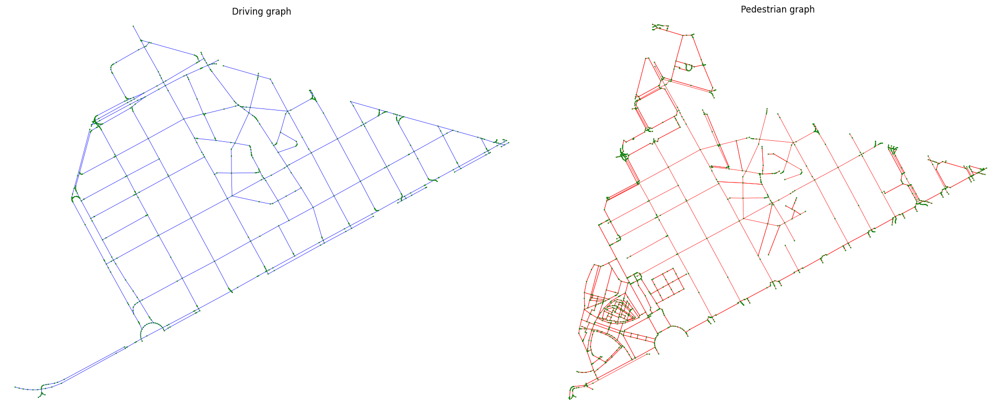

In [4]:
get_graph("russafa")
graph_map()

## Supergraph building

✅ Supergraph RUSSAFA created: 2235 nodes, 5312 edges.


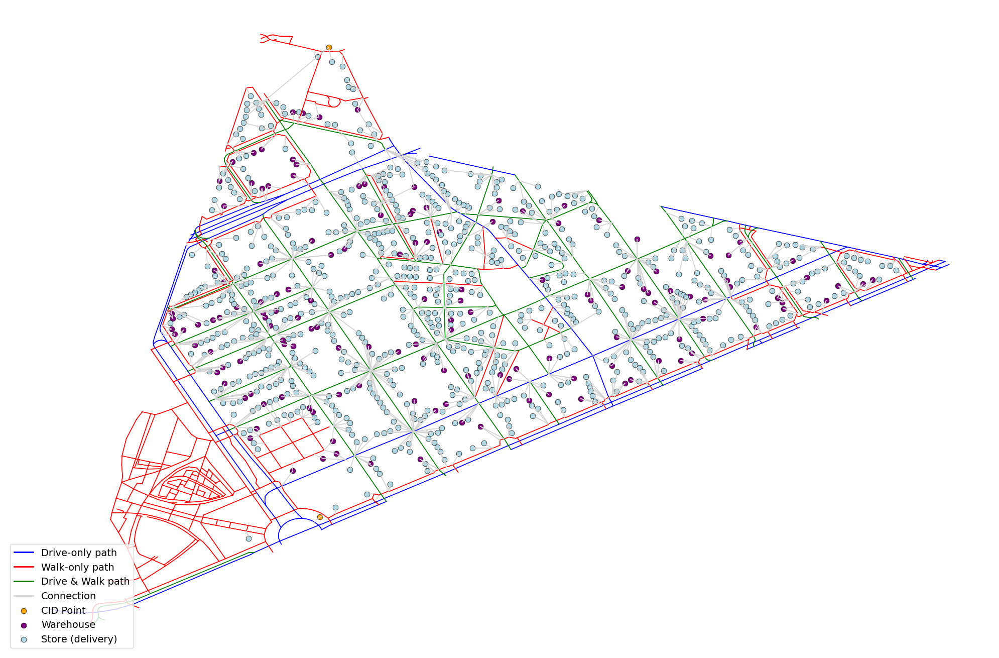

In [5]:
def build_supergraph(VELOCIDAD_PEATON=5,
                     VELOCIDAD_VEHICULO=35,
                     VELOCIDAD_CONEXION=10,
                     seed=None):
    """
    Construye el supergrafo uniendo G_drive y G_walk, añade nodos especiales
    y calcula tiempos de viaje con velocidades muestreadas de distribuciones
    normales. El parámetro `seed` hace que las muestras aleatorias sean reproducibles.
    """

    # Crea el RNG reproducible
    rng = np.random.RandomState(seed)

    # 1) Crear supergrafo vacío
    G_super = nx.MultiDiGraph()
    G_super.add_nodes_from(G_drive.nodes(data=True))
    G_super.add_nodes_from(G_walk.nodes(data=True))

    # 2) Función para fusionar aristas
    def add_or_merge_edge(G, u, v, key, data, mode):
        data = data.copy()
        modos = data.get('mode', [])
        if not isinstance(modos, list):
            modos = [modos]
        if mode not in modos:
            modos.append(mode)
        data['mode'] = modos

        if G.has_edge(u, v):
            for k_exist, existing in G[u][v].items():
                if existing.get('geometry') == data.get('geometry'):
                    exist_mod = existing.get('mode', [])
                    if not isinstance(exist_mod, list):
                        exist_mod = [exist_mod]
                    for m in modos:
                        if m not in exist_mod:
                            exist_mod.append(m)
                    existing['mode'] = exist_mod
                    return
        G.add_edge(u, v, key=key, **data)

    # Añadir aristas de conducción
    for u, v, k, data in G_drive.edges(keys=True, data=True):
        add_or_merge_edge(G_super, u, v, k, data, 'drive')
        if not data.get('oneway', True) or data.get('reversed', False):
            add_or_merge_edge(G_super, v, u, k, data, 'drive')
        elif not G_drive.has_edge(v, u):
            fake_data = data.copy()
            fake_data['fake'] = True
            dist = fake_data.get('length', 100)
            fake_data['length'] = dist * 5
            add_or_merge_edge(G_super, v, u, k, fake_data, 'drive')

    # Añadir aristas de paseo
    for u, v, k, data in G_walk.edges(keys=True, data=True):
        add_or_merge_edge(G_super, u, v, k, data, 'walk')
        if not G_walk.has_edge(v, u):
            add_or_merge_edge(G_super, v, u, k, data, 'walk')

    # 3) Haversine helper
    def haversine(coord1, coord2):
        lon1, lat1, lon2, lat2 = map(math.radians, [*coord1, *coord2])
        dlat, dlon = lat2 - lat1, lon2 - lon1
        a = math.sin(dlat / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon / 2)**2
        return 2 * math.asin(math.sqrt(a)) * 6371000

    # 4) Función para añadir nodo especial
    def add_special_node(G, geom, tipo, idx):
        nid = f"{tipo}_{idx}"
        lon, lat = geom.centroid.x, geom.centroid.y
        G.add_node(nid, x=lon, y=lat, tipo=tipo)

        conexiones = []
        if tipo in ['carga', 'almacen']:
            nd = ox.distance.nearest_nodes(G_drive, lon, lat)
            conexiones.append((nd, 'drive',
                                haversine((lon, lat),
                                          (G_drive.nodes[nd]['x'], G_drive.nodes[nd]['y']))))
            nw = ox.distance.nearest_nodes(G_walk, lon, lat)
            conexiones.append((nw, 'walk',
                                haversine((lon, lat),
                                          (G_walk.nodes[nw]['x'], G_walk.nodes[nw]['y']))))
        else:
            nw = ox.distance.nearest_nodes(G_walk, lon, lat)
            conexiones.append((nw, 'walk',
                                haversine((lon, lat),
                                          (G_walk.nodes[nw]['x'], G_walk.nodes[nw]['y']))))

        for vec, modo, dist in conexiones:
            G.add_edge(nid, vec, mode=['connection', modo], length=dist)
            G.add_edge(vec, nid, mode=['connection', modo], length=dist)

        return nid

    nodos_carga = [
        add_special_node(G_super, row.geometry, 'carga', i)
        for i, row in shp_loading_points.iterrows()
    ]
    nodos_comercios = [
        add_special_node(G_super, row.geometry, 'comercio', i)
        for i, row in shp_bajos[shp_bajos['Comercio']].iterrows()
    ]
    nodos_almacenes = [
        add_special_node(G_super, row.geometry, 'almacen', i)
        for i, row in shp_bajos[shp_bajos['Almacen']].iterrows()
    ]

    # 5) Añadir tiempos a aristas
    def calcular_tiempos_en_aristas(G, v_w, v_v, v_c, rng):
        def tpd(dist, vel):
            return dist / (vel * 1000 / 60)

        # Muestras con el RNG local
        v_peat = rng.normal(v_w, 0.2 * v_w, 30)
        v_conn = rng.normal(v_c, 0.2 * v_c, 30)
        v_veh  = rng.normal(v_v, 0.2 * v_v, 30)

        for u, v, k, data in G.edges(keys=True, data=True):
            d = data.get('length', 100)
            modos = data.get('mode', [])

            if 'connection' in modos:
                data['tiempo_walk']  = tpd(d, rng.choice(v_peat))
                data['tiempo_drive'] = tpd(d, rng.choice(v_conn))
                continue

            if 'walk' in modos:
                data['tiempo_walk'] = tpd(d, rng.choice(v_peat))

            if 'drive' in modos:
                vmax = data.get('maxspeed', rng.choice(v_veh))
                if isinstance(vmax, str):
                    vmax = int(''.join(filter(str.isdigit, vmax)) or 30)
                vkh = max(vmax * 0.5, rng.normal(vmax * 0.8, vmax * 0.1))
                data['tiempo_drive'] = tpd(d, vkh)

            # Asegurar que existe la clave
            data.setdefault('tiempo_walk', float('inf'))
            data.setdefault('tiempo_drive', float('inf'))

    calcular_tiempos_en_aristas(G_super,
                                VELOCIDAD_PEATON,
                                VELOCIDAD_VEHICULO,
                                VELOCIDAD_CONEXION,
                                rng)

    print(f"✅ Supergraph {barrio} created: {len(G_super.nodes)} nodes, {len(G_super.edges)} edges.")
    return G_super, nodos_carga, nodos_comercios, nodos_almacenes


def view_super(G_super):
    # 1) Configuración de figura
    fig, ax = plt.subplots(figsize=(20, 20))
    ax.set_aspect('equal', 'box')
    ax.axis('off')

    # 2) Colores para modos de arista
    edge_colors = {
        'drive': 'blue',
        'walk': 'red',
        'drive+walk': 'green',
        'connection': 'lightgray'
    }
    edges_by_mode = {mode: [] for mode in edge_colors}

    # 3) Agrupar segmentos por modo
    for u, v, data in G_super.edges(data=True):
        modos = data.get('mode', [])
        if isinstance(modos, list):
            if 'connection' in modos:
                key = 'connection'
            elif 'drive' in modos and 'walk' in modos:
                key = 'drive+walk'
            elif 'drive' in modos:
                key = 'drive'
            elif 'walk' in modos:
                key = 'walk'
            else:
                key = 'connection'
        else:
            key = modos if modos in edge_colors else 'connection'

        x0, y0 = G_super.nodes[u]['x'], G_super.nodes[u]['y']
        x1, y1 = G_super.nodes[v]['x'], G_super.nodes[v]['y']
        edges_by_mode[key].append(((x0, x1), (y0, y1)))

    # 4) Dibujar aristas
    for mode, segments in edges_by_mode.items():
        for xs, ys in segments:
            ax.plot(xs, ys, color=edge_colors[mode], linewidth=1)

    # 5) Definir categorías de nodos
    categorias = {
        'cid':               {'coords': [], 'color': 'orange',     'label': 'CID Point'},
        'almacen_m3':        {'coords': [], 'color': 'purple',     'label': 'Warehouse'},
        'comercio_entrega':  {'coords': [], 'color': 'lightblue', 'label': 'Store (delivery)'},
        'almacen_y_comercio':{'coords': [], 'color': 'black',     'label': 'Warehouse & Shop'}
    }

    # 6) Recolectar coordenadas
    for nodo, data in G_super.nodes(data=True):
        tipo = data.get('tipo')
        coord = (data['x'], data['y'])
        if tipo == 'carga':
            categorias['cid']['coords'].append(coord)
        elif tipo == 'almacen' and 'comercio' in nodo:
            categorias['almacen_y_comercio']['coords'].append(coord)
        elif tipo == 'almacen':
            categorias['almacen_m3']['coords'].append(coord)
        elif tipo == 'comercio':
            categorias['comercio_entrega']['coords'].append(coord)

    # 7) Dibujar nodos
    for cat in categorias.values():
        if cat['coords']:
            xs, ys = zip(*cat['coords'])
            ax.scatter(xs, ys, color=cat['color'], s=60,
                       edgecolor='k', linewidth=0.5, label=cat['label'])

    # 8) Leyenda de aristas
    edge_legend = [
        Line2D([0], [0], color=edge_colors[m], lw=2, label=label)
        for m, label in [
            ('drive', 'Drive-only path'),
            ('walk', 'Walk-only path'),
            ('drive+walk', 'Drive & Walk path'),
            ('connection', 'Connection')
        ]
    ]

    # 9) Combinar leyendas y mostrar
    handles_nodes, labels_nodes = ax.get_legend_handles_labels()
    handles = edge_legend + handles_nodes 
    labels  = [l.get_label() for l in edge_legend] + labels_nodes
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(),
              loc='lower left', fontsize=14)

    plt.tight_layout()
    plt.show()


# Después de llamar a build_supergraph
G_super, nodos_carga, nodos_comercios, nodos_almacenes = build_supergraph()
view_super(G_super)

## M2 Pipeline

### 1º Deliveries sample

In [6]:
PAQUETES = 1900              # Número total de paquetes a repartir
PAQUETES_MINIMO = 1               # Mínimo de paquetes por comercio
PAQUETES_MAXIMO = 5               # Máximo de paquetes por comercio
CAPACIDAD_MAXIMA_WALK = 8      # Capacidad máxima que puede cargar el repartidor
CAPACIDAD_MAXIMA_ONA = 20      # Capacidad máxima que puede cargar el robot

def calcular_tiempo_walk(G, origen, destino):
    """Ruta más rápida a pie entre origen y destino (minutos), usando el grafo G."""
    try:
        camino = nx.shortest_path(G, origen, destino, weight='tiempo_walk')
    except nx.NetworkXNoPath:
        return float('inf'), None
    tiempo = 0.0
    for u, v in zip(camino[:-1], camino[1:]):
        ed = G.get_edge_data(u, v)
        t_min = min(e['tiempo_walk'] for e in ed.values())
        tiempo += t_min
    return tiempo, camino

def calcular_tiempo_drive(G, origen, destino):
    """Ruta más rápida en vehículo entre origen y destino (minutos), usando el grafo G."""
    try:
        camino = nx.shortest_path(G, origen, destino, weight='tiempo_drive')
    except nx.NetworkXNoPath:
        return float('inf'), []
    tiempo = 0.0
    for u, v in zip(camino[:-1], camino[1:]):
        ed = G.get_edge_data(u, v)
        tiempo += min(e.get('tiempo_drive', math.inf) for e in ed.values())
    return tiempo, camino

def generate_context(nodos_comercios,
                     N_PAQUETES=100,
                     PAQUETES_MIN=1,
                     PAQUETES_MAX=5,
                     CAPACIDAD_MAXIMA=8,
                     FACTOR_AJUSTE=0.75,
                     seed=None):
    """
    Selecciona comercios aleatorios y reparte paquetes sobre ellos de forma eficiente,
    eliminando del muestreo aquellos nodos que no puedan recibir la cantidad mínima de paquetes.

    Args:
      nodos_comercios (list): lista de IDs de nodo “comercio” en G_super (variable global).
      N_PAQUETES      (int): total de paquetes a repartir.
      PAQUETES_MIN    (int): mínimo paquetes por comercio.
      PAQUETES_MAX    (int): máximo paquetes por comercio.
      CAPACIDAD_MAXIMA(int): capacidad máxima que un nodo puede recibir.
      FACTOR_AJUSTE   (float): factor para ajustar N_PAQUETES cuando se acerca al límite de capacidad.

    Devuelve:
      n_paq (int): número final de paquetes asignados.
      GeoDataFrame con columnas ['node', 'paquetes', 'geometry'].
      entrada (str): nodo de entrada para el repartidor.
    """

    # Instanciamos un RNG local
    rng = np.random.RandomState(seed)
    
    
    # Validación de parámetros
    if (PAQUETES_MAX < PAQUETES_MIN or PAQUETES_MIN < 0 or 
        PAQUETES_MAX < 0 or CAPACIDAD_MAXIMA < 0 or 
        CAPACIDAD_MAXIMA < min(PAQUETES_MIN, PAQUETES_MAX)):
        raise ValueError("Invalid values for constants. Check the input values.")
    
    n_comercios = len(nodos_comercios)
    max_paquetes = n_comercios * CAPACIDAD_MAXIMA
    proporcion = N_PAQUETES / max_paquetes
    
    # Ajuste preliminar de N_PAQUETES si la proporción es alta
    if proporcion >= FACTOR_AJUSTE:
        N_PAQUETES = int(max_paquetes * FACTOR_AJUSTE)
    
    # Inicializar capacidades y lista de nodos disponibles
    capacidades = {nodo: CAPACIDAD_MAXIMA for nodo in nodos_comercios}
    available_nodes = nodos_comercios.copy()  # lista mutable de nodos disponibles

    # Listas para almacenar asignaciones
    seleccionados = []
    paquetes_asignados_list = []
    
    paquetes_asignados = 0
    n_paq = N_PAQUETES

    # Bucle principal: mientras haya paquetes por asignar y nodos disponibles
    while paquetes_asignados < N_PAQUETES and available_nodes:
        restante = N_PAQUETES - paquetes_asignados
        max_pos = min(PAQUETES_MAX, restante)
        if max_pos < PAQUETES_MIN:
            break

        # Selección aleatoria eficiente: 
        idx = available_nodes.index(rng.choice(available_nodes))
        nodo = available_nodes[idx]
        cap_restante = capacidades[nodo]

        # Si el nodo no tiene capacidad para PAQUETES_MIN, se elimina de la lista
        if cap_restante < PAQUETES_MIN:
            available_nodes[idx] = available_nodes[-1]
            available_nodes.pop()
            continue

        # Determinar la cantidad de paquetes a asignar
        paquetes_a_asignar = rng.randint(PAQUETES_MIN, min(max_pos, cap_restante)+1)
        
        # Registrar la asignación
        seleccionados.append(nodo)
        paquetes_asignados_list.append(paquetes_a_asignar)
        
        capacidades[nodo] -= paquetes_a_asignar
        paquetes_asignados += paquetes_a_asignar

        # Si tras la asignación la capacidad es insuficiente, se elimina el nodo de la lista
        if capacidades[nodo] < PAQUETES_MIN:
            available_nodes[idx] = available_nodes[-1]
            available_nodes.pop()
    
    # Agrupar las asignaciones por nodo
    asignacion_por_nodo = {}
    for nodo, paquetes in zip(seleccionados, paquetes_asignados_list):
        asignacion_por_nodo[nodo] = asignacion_por_nodo.get(nodo, 0) + paquetes

    # Construir la lista de datos para el GeoDataFrame usando la variable global G_super para obtener coordenadas
    data = []
    for nodo, total in asignacion_por_nodo.items():
        lon = G_super.nodes[nodo]['x']
        lat = G_super.nodes[nodo]['y']
        data.append({
            'node': nodo,
            'paquetes': total,
            'geometry': Point(lon, lat)
        })

    # Elegir punto de entrada
    thresh, thresh_max = 0.0001, 0.1
    entrada = None
    while entrada is None:
        boundary = [n for n, d in G_super.nodes(data=True)
                    if shp_zone.boundary.distance(Point(d['x'], d['y'])) < thresh and 'tipo' not in data ]
        if len(boundary) < 5:
            thresh = min(thresh * 3, thresh_max)
            if thresh >= thresh_max:
                raise RuntimeError("No hay nodos periféricos válidos.")
            continue

        rng.shuffle(boundary)
        for b in boundary: 
            random_cid = rng.choice(nodos_carga)
            try:
                t, _ = calcular_tiempo_drive(G_super, b, random_cid) # para asegura que esta en drive
                if t < 1000:
                    entrada = b
                    break
            except nx.NetworkXNoPath:
               continue
        thresh = min(thresh * 3, thresh_max)

    return n_paq, gpd.GeoDataFrame(data, crs="EPSG:4326"), entrada

paq, df_comercios, nodo_entrada= generate_context(nodos_comercios,
                                     N_PAQUETES=PAQUETES, seed=30)
print(f"Paquetes asignados: {paq}")
display(df_comercios)


Paquetes asignados: 1900


,node,paquetes,geometry
0,comercio_21715,7,POINT (-0.37304 39.46126)
1,comercio_19501,8,POINT (-0.37595 39.46233)
2,comercio_19510,8,POINT (-0.37675 39.4618)
3,comercio_21719,2,POINT (-0.37218 39.46141)
4,comercio_24597,4,POINT (-0.36709 39.46156)
...,...,...,...
443,comercio_18713,2,POINT (-0.37669 39.46591)
444,comercio_22496,3,POINT (-0.3717 39.46259)
445,comercio_20281,5,POINT (-0.37528 39.46231)
446,comercio_19579,2,POINT (-0.37478 39.46624)


### 2º HUB SELECTION

In [7]:
def planificar_hub(nodo_entrada, nodos_almacenes, percentil=50, seed=None):
    """
    Selecciona un hub de almacén cercano al centroide del grafo y calcula la ruta
    desde un nodo de entrada hasta ese hub. Si el hub elegido falla, reintenta con
    los demás candidatos.

    Parámetros:
    - nodo_entrada: Nodo inicial (depósito periférico) desde el que partimos.
    - nodos_almacenes: Lista de nodos de almacenes disponibles.
    - percentil: Percentil de almacenes más cercanos al centroide a considerar (por defecto 50).
    - seed: Semilla para la aleatoriedad (opcional).

    Retorna:
    - dict con:
        'depot'   : nodo_entrada,
        'hub'     : nodo seleccionado con ruta válida,
        't_drive' : tiempo de conducción al hub (en minutos),
        'dist'    : distancia total (en km),
        'camino'  : lista de nodos que forman la ruta
      o None si ningún candidato tiene ruta.
    """
    # Instanciamos un RNG local
    rng = np.random.RandomState(seed)

    # 1. Calcular el centroide usando todos los almacenes
    xs = [G_super.nodes[n]['x'] for n in nodos_almacenes]
    ys = [G_super.nodes[n]['y'] for n in nodos_almacenes]
    centroide = Point(np.mean(xs), np.mean(ys))

    # 2. Medir distancia euclídea de cada almacén al centroide
    distancias = [
        (n, centroide.distance(Point(G_super.nodes[n]['x'],
                                     G_super.nodes[n]['y'])))
        for n in nodos_almacenes
    ]

    # 3. Obtener los N más cercanos según el percentil
    num_cand = math.ceil(len(distancias) * (percentil / 100))
    candidatos = sorted(distancias, key=lambda x: x[1])[:num_cand]
    almacenes_cercanos = [n for n, _ in candidatos]

    # 4. Intentar cada hub en orden aleatorio hasta encontrar ruta válida
    for hub in rng.choice(almacenes_cercanos,size=len(almacenes_cercanos),
    replace=False):
        try:
            t_drive, camino = calcular_tiempo_drive(G_super, nodo_entrada, hub)
            if np.isfinite(t_drive):
                distancia_m = sum(
                    G_super.get_edge_data(u, v)[0]['length']
                    for u, v in zip(camino[:-1], camino[1:])
                )
                return {
                    'depot': nodo_entrada,
                    'hub': hub,
                    't_drive': t_drive,
                    'dist': distancia_m / 1000,
                    'camino': camino
                }
        except nx.NetworkXNoPath:
            # Este hub no conecta, pasamos al siguiente candidato
            continue

    # Si agotamos todos los candidatos sin éxito:
    print(f"❌ Ningún hub de los {len(almacenes_cercanos)} candidatos tuvo ruta válida.")
    return None



hub_route = planificar_hub(nodo_entrada, nodos_almacenes, percentil=50, seed=30)
if hub_route:
    print(f"✅ Desde el depósito {hub_route['depot']} se llega al HUB {hub_route['hub']} "
          f"en {hub_route['t_drive']:.2f} min y {hub_route['dist']:.2f} km.")
else:
    print("No se pudo planificar la ruta al hub.")


✅ Desde el depósito 111132209 se llega al HUB almacen_20894 en 1.85 min y 0.95 km.


### 3º CLUSTERING

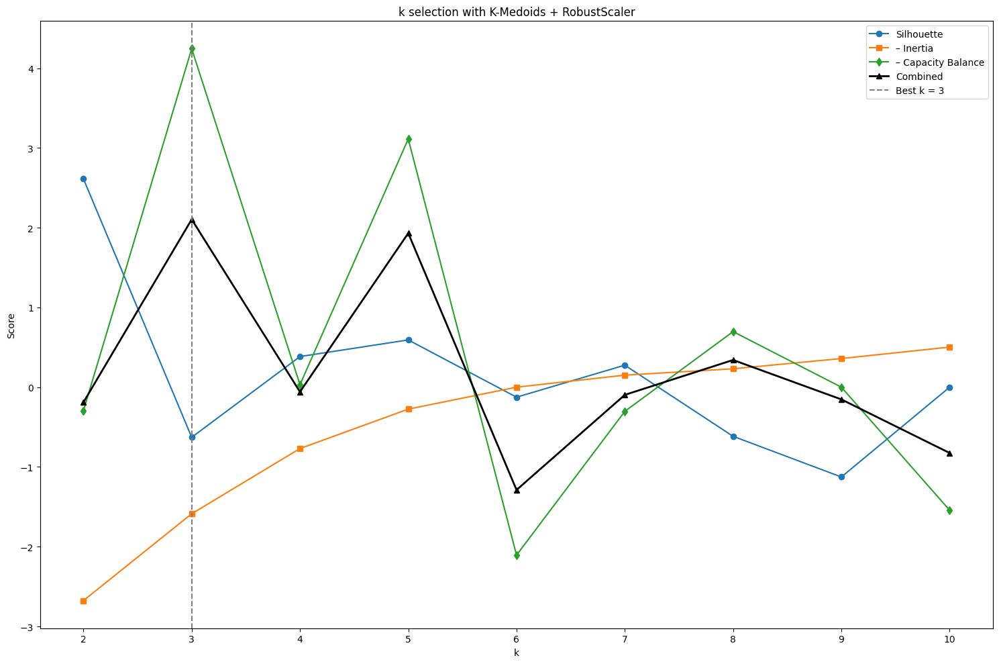

✅ Deliveries assigned to 3 robots (K-Medoids + hub-balanced).


In [8]:
def clustering(df_comercios, hub_route, cap_max=20, k_min=2, k_max=10, alpha=0.2, beta=0.2, gamma=0.6, seed = None, view=True):
    """
    Clustering de los comercios usando K-Medoids, evaluando el mejor número de clústeres con el
    método combinado de Silhouette, Inertia, y Balance de Capacidad, con ponderaciones.

    Args:
      df_comercios    : DataFrame con ['node', 'paquetes', 'geometry', 'grupo_repartidor'].
      hub_route           : Info del hub, para calcular la distancia de balance de capacidad.
      cap_max         : Capacidad máxima de la ruta para el balance.
      k_min           : Número mínimo de clústeres.
      k_max           : Número máximo de clústeres.
      alpha           : Peso del índice Silhouette.
      beta            : Peso de la Inertia.
      gamma           : Peso del balance de capacidad.
      seed            : Semilla para la aleatoriedad (opcional).

    Returns:
      best_k          : El mejor número de clústeres encontrado.
    """

    # 1) Extraemos las coordenadas y demandas
    coords = np.vstack([df_comercios.geometry.x.values, df_comercios.geometry.y.values]).T
    hub = hub_route['hub']
    hub_coord = (G_super.nodes[hub]['x'], G_super.nodes[hub]['y'])
    demands = df_comercios['paquetes'].to_numpy()

    ks, sils, ines, balances = [], [], [], []
    hub_x, hub_y = hub_coord

    for k in range(k_min, min(k_max + 1, len(df_comercios))):
        # 2) Entrenamos K-Medoids
        kmed = KMedoids(n_clusters=k, init='k-medoids++', method='pam', metric='euclidean', random_state=seed)
        labels = kmed.fit_predict(coords)

        # 3) Calculamos el índice de Silhouette
        sil = silhouette_score(coords, labels) if k > 1 else 0

        # 4) Calculamos la Inertia manualmente usando las posiciones de los medoids
        medoids = coords[kmed.medoid_indices_]
        inertia = sum(np.sum((coords[labels == j] - medoids[j]) ** 2) for j in range(k))

        # 5) Balance de capacidad
        loads = np.array([demands[labels == j].sum() for j in range(k)])
        mults = np.ceil(loads / cap_max) * cap_max
        errors = (loads - mults) ** 2
        bal = np.mean(errors)

        ks.append(k)
        sils.append(sil)
        ines.append(inertia)
        balances.append(bal)

    # 6) Escalado robusto de las métricas
    scaler = RobustScaler()
    sil_r = scaler.fit_transform(np.array(sils).reshape(-1, 1)).ravel()
    ine_r = -scaler.fit_transform(np.array(ines).reshape(-1, 1)).ravel()
    bal_r = -scaler.fit_transform(np.array(balances).reshape(-1, 1)).ravel()

    # 7) Combinamos las métricas con penalización por número de clústeres
    combined = alpha * sil_r + beta * ine_r + gamma * bal_r
    best_idx = np.argmax(combined)
    best_k = ks[best_idx]

    if view:
      # 8) Visualización del diagnóstico
      fig, ax = plt.subplots(figsize=(15, 10))
      ax.plot(ks, sil_r, marker='o', label='Silhouette')
      ax.plot(ks, ine_r, marker='s', label='– Inertia')
      ax.plot(ks, bal_r, marker='d', label='– Capacity Balance')
      ax.plot(ks, combined, marker='^', lw=2, color='black', label='Combined')
      ax.axvline(best_k, ls='--', color='gray', label=f'Best k = {best_k}')
      ax.set(xlabel='k', ylabel='Score', title='k selection with K-Medoids + RobustScaler')
      ax.legend()
      plt.tight_layout()
      plt.show()

    # 9) Clustering final con el mejor k encontrado
    kmed = KMedoids(n_clusters=best_k, init='k-medoids++', method='pam', metric='euclidean', random_state=seed)
    labels = kmed.fit_predict(coords)
    df_comercios['grupo_repartidor'] = labels + 1  
    
    return best_k, df_comercios

# Ejemplo de uso
best_k, df_comercios = clustering(df_comercios, hub_route, CAPACIDAD_MAXIMA_ONA, seed=42)
print(f"✅ Deliveries assigned to {best_k} robots (K-Medoids + hub-balanced).")


In [9]:
def view_clustering(df_comercios, hub_route, view=True):
    """
    Dibuja el resultado de la Fase 1 en un mapa interactivo usando Folium.

    Args:
      df_comercios   : DataFrame con ['node','paquetes','geometry','grupo_repartidor'].
       hub_route      : dict con info del hub y ruta.
    
    Devuelve:
      folium.Map con:
       - Véase el grafo de las calles.
       - Comercios coloreados según grupo_repartidor.
       - Hub como marcador.
    """
    # 1) Preparar paleta de colores (uno por cada grupo_repartidor)
    unique_groups = sorted(df_comercios['grupo_repartidor'].unique().tolist())
    valid_colors = list(mcolors.TABLEAU_COLORS.values()) + list(mcolors.CSS4_COLORS.values())
    random.seed(0)
    group_color_map = {group: valid_colors[i % len(valid_colors)] 
                       for i, group in enumerate(unique_groups)}

    # 2) Mapa base
    centroide = df_comercios.geometry.union_all().centroid
    centro = [centroide.y, centroide.x]
    m = folium.Map(location=centro, zoom_start=16)
    folium.TileLayer("cartodb positron").add_to(m)
    folium.TileLayer("OpenStreetMap").add_to(m) 
    # 3) Polígono de zona (si corresponde)
    if shp_zone is not None:
        folium.GeoJson(
            shp_zone,
            style_function=lambda f: {
                "color": "green", "weight": 2,
                "fill": True, "fillColor": "limegreen", "fillOpacity": 0.1
            },
            control=False
        ).add_to(m)

    # 4) Grafo en gris
    for u, v, _ in G_super.edges(data=True):
        y0, x0 = G_super.nodes[u]['y'], G_super.nodes[u]['x']
        y1, x1 = G_super.nodes[v]['y'], G_super.nodes[v]['x']
        folium.PolyLine([(y0, x0), (y1, x1)],
                        color="lightgray", weight=1, opacity=0.3).add_to(m)

    # 5) Comercios coloreados según grupo_repartidor
    for _, row in df_comercios.iterrows():
        color = group_color_map[row['grupo_repartidor']]
        folium.CircleMarker(
            location=(row.geometry.y, row.geometry.x),
            radius=6, color="black", weight=0.5,
            fill=True, fill_color=color, fill_opacity=0.9,
            popup=f"{row['node']} \nPaquetes: {row['paquetes']}",
        ).add_to(m)

    # 6) Hub (marcador del hub)
    hubs_layer = folium.FeatureGroup(name="Hub Route", show=True)
    hub = hub_route['hub']
    hub_x = G_super.nodes[hub]['x']
    hub_y = G_super.nodes[hub]['y']
    folium.Marker(
        location=(hub_y, hub_x),
        icon=folium.Icon(color="black", icon="warehouse", prefix="fa"),
        popup=f"Hub: {hub}"
    ).add_to(hubs_layer)

    camino_deposito_hub, t_drive, dist_drive = hub_route['camino'], hub_route['t_drive'], hub_route['dist']
    # Verificar que haya un camino entre el depósito y el Hub
    if camino_deposito_hub:
        for u, v in zip(camino_deposito_hub[:-1], camino_deposito_hub[1:]):
            y0, x0 = G_super.nodes[u]['y'], G_super.nodes[u]['x']
            y1, x1 = G_super.nodes[v]['y'], G_super.nodes[v]['x']
            folium.PolyLine([(y0, x0), (y1, x1)],
                            color="black", weight=3, opacity=0.5,
                            popup=f"Tiempo: {t_drive:.2f} min \nDistancia: {dist_drive:.2f} km").add_to(hubs_layer)
        
        # Añadir marcador para el primer nodo del camino (punto de entrada, depósito)
        entry_node = camino_deposito_hub[0]
        entry_x, entry_y = G_super.nodes[entry_node]['x'], G_super.nodes[entry_node]['y']
        folium.Marker(
            location=(entry_y, entry_x),
            icon=folium.Icon(color="black", icon="play", prefix="fa"),
            popup=f"Punto de entrada: {entry_node}"
        ).add_to(hubs_layer)
        
        hubs_layer.add_to(m)

    # 7) Control de capas (opcional)
    if view:
        folium.LayerControl(collapsed=False).add_to(m)

    return m

view_clustering(df_comercios, hub_route)

### 4º INSIDE CLUSTERS ROUTES

In [10]:
def cluster_routes(df_comercios, hub_route, capacidad_maxima=20):
    """
    Calcular rutas de entrega para cada grupo de repartidor usando CVRP con OR-Tools,
    tiempos en segundos, manejo de 'inf' y cómputo de distancia recorrida por ruta.
    
    Args:
      df_comercios     : DataFrame con ['node', 'paquetes', 'geometry', 'grupo_repartidor'].
      capacidad_maxima : int, capacidad máxima de paquetes por ruta.
      
    Returns:
      routes_df        : DataFrame con rutas por cada grupo de repartidor ['grupo_repartidor', 'sequence', 'time_min', 'distance_km', 'load'].
    """
    
    all_routes = []
    total_time_sec = 0
    total_batches = 0
    INF_SEC = 10**9  # Valor para distancias infinitas (cuando no hay conexión)
    
    # Agrupar comercios por 'grupo_repartidor'
    grupos_repartidor = df_comercios['grupo_repartidor'].unique()
    
    # Iteramos sobre cada grupo de repartidor
    for grupo_sel in grupos_repartidor:
        # Filtrar comercios de ese grupo
        sub_bajos = df_comercios[df_comercios['grupo_repartidor'] == grupo_sel]
        N = len(sub_bajos) + 1
        
        # Si no hay comercios para este grupo, continuar con el siguiente
        if N == 0:
            continue
        
        # 1) Nodos y demandas (los comercios dentro del grupo + el hub)
        hub = hub_route['hub']  # El nodo del hub
        locations = list(sub_bajos['node'])  # Los nodos de comercios
        locations.insert(0, hub)  # Añadir el hub como punto de inicio
        demands = list(sub_bajos['paquetes'])  # Demandas de paquetes
        demands.insert(0, 0)  # El hub tiene demanda cero
        
        # 2) Matriz de tiempos (segundos) entre los comercios
        time_matrix = [[0]*N for _ in range(N)]
        for i in range(N):
            for j in range(N):
                if i == j:
                    continue
                try:
                    t_min, _ = calcular_tiempo_walk(G_super, locations[i], locations[j])  # Intentamos con G_super
                except Exception:
                    t_min = INF_SEC  # Si no hay ruta, marcarlo como "infinito"
                time_matrix[i][j] = INF_SEC if not np.isfinite(t_min) else int(math.ceil(t_min * 60))  # Convertir a minutos
        
        # 3) Número de rutas necesarias
        total_demand = sum(demands)
        R = math.ceil(total_demand / capacidad_maxima)  # El número de rutas necesarias
        
        # 4) Configurar OR-Tools para el problema de CVRP
        manager = pywrapcp.RoutingIndexManager(N, R, 0)
        routing = pywrapcp.RoutingModel(manager)

        def time_callback(f, t):
            return time_matrix[manager.IndexToNode(f)][manager.IndexToNode(t)]
        
        cb_t = routing.RegisterTransitCallback(time_callback)
        routing.SetArcCostEvaluatorOfAllVehicles(cb_t)

        def demand_callback(idx):
            return demands[manager.IndexToNode(idx)]
        
        cb_d = routing.RegisterUnaryTransitCallback(demand_callback)
        routing.AddDimensionWithVehicleCapacity(cb_d, 0, [capacidad_maxima+1]*R, True, "Capacity")

        search_params = pywrapcp.DefaultRoutingSearchParameters()
        search_params.first_solution_strategy = routing_enums_pb2.FirstSolutionStrategy.SAVINGS
        search_params.time_limit.seconds = 10

        # Resolver el problema con OR-Tools
        try:
            sol = routing.SolveWithParameters(search_params)
            if not sol:
                raise RuntimeError(f"No solution CVRP for group {grupo_sel}")
        except RuntimeError:
            print(f"❌ Error: No se encontró solución para el grupo {grupo_sel}.")
            continue

        # 5) Extraer rutas y calcular distancia
        for v in range(R):
            idx = routing.Start(v)
            if routing.IsEnd(sol.Value(routing.NextVar(idx))):
                continue
            seq_nodes = []
            load = 0
            time_sec = 0
            dist_m = 0.0
            # Construir la ruta
            while not routing.IsEnd(idx):
                n = manager.IndexToNode(idx)
                seq_nodes.append(locations[n])
                load += demands[n]
                nxt = sol.Value(routing.NextVar(idx))
                time_sec += routing.GetArcCostForVehicle(idx, nxt, v)

                # Calcular la distancia tramo a tramo
                a, b = locations[n], locations[manager.IndexToNode(nxt)]
                _, path = calcular_tiempo_walk(G_super, a, b)  # Usamos G_super para la distancia
                if path:
                    for u, w in zip(path[:-1], path[1:]):
                        ed = G_super.get_edge_data(u, w)
                        dist_m += min(e.get('length', 0) for e in ed.values())

                idx = nxt

            # Retorno opcional al depósito (hub)
            seq_nodes.append(hub)

            # Almacenar resultados
            all_routes.append({
                'grupo_repartidor': grupo_sel,
                'sequence': seq_nodes,
                'time_min': round(time_sec / 60, 3),
                'distance_km': round(dist_m / 1000, 3),
                'load': load
            })
            total_time_sec += time_sec
            total_batches += 1

    # Crear un DataFrame con los resultados
    routes_df = pd.DataFrame(all_routes)
    return routes_df

# === Ejemplo de uso ===
routes_df = cluster_routes(df_comercios, hub_route)
display(routes_df)


,grupo_repartidor,sequence,time_min,distance_km,load
0,3,"[almacen_20894, comercio_22493, comercio_22524...",40.633,3.535,21
1,3,"[almacen_20894, comercio_21006, comercio_21772...",38.283,3.310,21
2,3,"[almacen_20894, comercio_23224, comercio_22518...",40.833,3.489,21
3,3,"[almacen_20894, comercio_21749, comercio_21773...",38.417,3.399,21
4,3,"[almacen_20894, comercio_21794, comercio_19583...",41.883,3.625,21
...,...,...,...,...,...
87,2,"[almacen_20894, comercio_23228, comercio_23208...",24.950,2.270,19
88,2,"[almacen_20894, comercio_24173, comercio_23784...",21.767,1.956,21
89,2,"[almacen_20894, comercio_23785, comercio_24176...",21.567,1.917,21
90,2,"[almacen_20894, comercio_23130, comercio_23763...",19.250,1.685,20


In [14]:
def view_walk_routes(df_comercios, hub_route, routes_df, view=True):
    """
    Dibuja un mapa interactivo para  las rutas de entrega y la capa de caminos.
    
    Args:
      df_comercios   : DataFrame con ['node', 'paquetes', 'geometry', 'grupo_repartidor'].
      hub_route      : info  del camino entre el depósito y el hub.
      routes_df      : DataFrame con las rutas generadas, con columnas ['grupo_repartidor', 'sequence', 'time_min', 'distance_km', 'load'].
      view           : Booleano que indica si se debe mostrar el control de capas del mapa.
    
    Devuelve:
      folium.Map con:
       - El mapa de las rutas de los grupos de repartidores.
       - Cada grupo de repartidores representado con un color diferente.
       - Las rutas de cada grupo como líneas punteadas.
       - Control de capas para activar/desactivar las rutas.
    """
    m = view_clustering(df_comercios, hub_route, view=False)

    # 1) Preparar paleta de colores (uno por cada grupo_repartidor)
    unique_groups = sorted(df_comercios['grupo_repartidor'].unique().tolist())
    valid_colors = list(mcolors.TABLEAU_COLORS.values()) + list(mcolors.CSS4_COLORS.values())
    random.seed(0)
    group_color_map = {group: valid_colors[i % len(valid_colors)] 
                       for i, group in enumerate(unique_groups)}


    # 2) Creamos la capa de rutas
    route_layer = folium.FeatureGroup(name="Cluster Routes", show=True)
    for i, row in routes_df.iterrows():
        repartidor   = row['grupo_repartidor']
        color = valid_colors[i%len(valid_colors)]
        seq   = row['sequence']

        # reconstruimos la lista de coordenadas de cada tramo
        coords = []
        for a, b in zip(seq[:-1], seq[1:]):
            _, path = calcular_tiempo_walk(G_super, a, b)
            if path:
                coords.extend([
                        (G_super.nodes[n]['y'], G_super.nodes[n]['x'])
                        for n in path
                    ])
            

        # añadimos la PolyLine punteada
        folium.PolyLine(
            coords,
            color=color,
            weight=3,
            opacity=0.7,
            dash_array="5,10",
            popup=f"Paquetes: {row['load']} \nTiempo: {row['time_min']:.2f} min \nDistancia: {row['distance_km']:.2f} km"
        ).add_to(route_layer)

        for nodo in seq:
            for _, row in df_comercios.iterrows():
                if nodo == row['node']:
                    folium.CircleMarker(
                        location=(row.geometry.y, row.geometry.x),
                        radius=6, color="black", weight=0.5,
                        fill=True, fill_color=color, fill_opacity=0.9,
                        popup=f"{row['node']} \nPaquetes: {row['paquetes']}\nRuta: {i+1}"
                    ).add_to(route_layer)
                    break

    # 3) Incorporamos la capa y actualizamos control de capas
    route_layer.add_to(m)
    if view:
        folium.LayerControl(collapsed=False).add_to(m)
    return m

view_walk_routes(df_comercios, hub_route, routes_df)

### 5º COSTS

In [12]:
def calculate_results_m2(routes_df, hub_route):
  """
  Calcula el coste total del reparto sumando costes fijos, por tiempo y por distancia, 
  diferenciando entre las rutas desde el **depósito al CID** (furgoneta) y las rutas 
  desde el **CID al hub** (ONA).
  
  Args:
    routes_df    : DataFrame con ['time_min', 'distance_km', 'grupo_repartidor'] de las rutas generadas.
    hub_route   : Información del camino entre el depósito y el hub, incluyendo tiempo y distancia.
  
  Returns:
    total_cost   : Coste total calculado, que incluye los costes fijos, por tiempo y por distancia.
  """
  # Definición de las constantes fuera de la función
  FIXED_DAILY_RATE_VAN      = 31.76   # €/día
  TIME_HOURLY_RATE_VAN      = 21.19 + FIXED_DAILY_RATE_VAN / 8  # €/hora
  DISTANCE_PER_KM_RATE_VAN  = 0.184   # €/km

  FIXED_DAILY_RATE_ONA      = 35.42   # €/día
  TIME_HOURLY_RATE_ONA      = 9.58 + FIXED_DAILY_RATE_ONA / 8  # €/hora
  DISTANCE_PER_KM_RATE_ONA  = 0.055   # €/km
  total_kms_walk = routes_df['distance_km'].sum() 
  total_hours_walk = routes_df['time_min'].sum() / 60 
  total_kms_drive = hub_route['dist']
  total_hours_drive = hub_route['t_drive'] / 60

  distance_cost_van = total_kms_drive * DISTANCE_PER_KM_RATE_VAN 
  distance_cost_ona = total_kms_walk * DISTANCE_PER_KM_RATE_ONA
  time_cost_van = total_hours_drive * TIME_HOURLY_RATE_VAN
  time_cost_ona = total_hours_walk * TIME_HOURLY_RATE_ONA
  
  results = {
    'total_kms_walk': total_kms_walk,
    'total_hours_walk': total_hours_walk,
    'total_kms_drive': total_kms_drive,
    'total_hours_drive': total_hours_drive,
    'distance_cost_van': distance_cost_van,
    'distance_cost_ona': distance_cost_ona,
    'time_cost_van': time_cost_van,
    'time_cost_ona': time_cost_ona,
    'total_cost': distance_cost_van + time_cost_van + distance_cost_ona + time_cost_ona
  }

  return {categoria: round(valor, 4)  for categoria, valor in results.items()}


resultados = calculate_results_m2(routes_df, hub_route)

print("\n" + "-"*50)
print(f"RESULTADOS M2 DE {barrio} ({paq} paquetes)".center(50))

print("-" * 50)

for i, (categoria, valor) in enumerate(resultados.items()):
  if i == len(resultados.items()) - 1:  
    break
  print(f"{categoria.replace('_', ' ').title():<25}: {valor:,.2f} {'km' if 'kms' in categoria else '€' if 'cost' in categoria else 'h'}")

print("-" * 50)
print(f"{'TOTAL COSTE DEL REPARTO ':<25}: {resultados['total_cost']:,.2f} €")
print("-" * 50)


--------------------------------------------------
     RESULTADOS M2 DE RUSSAFA (1900 paquetes)     
--------------------------------------------------
Total Kms Walk           : 197.38 km
Total Hours Walk         : 37.46 h
Total Kms Drive          : 0.95 km
Total Hours Drive        : 0.03 h
Distance Cost Van        : 0.17 €
Distance Cost Ona        : 10.86 €
Time Cost Van            : 0.78 €
Time Cost Ona            : 524.65 €
--------------------------------------------------
TOTAL COSTE DEL REPARTO  : 536.46 €
--------------------------------------------------
